In [1]:
# this sets up basic packages
import numpy as np
import pandas as pd
import astropy.units as u
import astropy.cosmology.units as cu

# this sets up matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# this sets up astropy
from astropy.io import fits
from astropy.table import Table
from astropy.wcs import WCS
from astropy.wcs.utils import pixel_to_skycoord, skycoord_to_pixel
from astropy.utils.data import get_pkg_data_filename
from astropy.coordinates import SkyCoord, Angle, match_coordinates_sky, Distance
from astropy.cosmology import Planck15 as cosmo

from astropy.nddata import Cutout2D
from regions import PixCoord, Regions, CircleSkyRegion, CirclePixelRegion

from astropy.visualization import make_lupton_rgb

In [2]:
# this is the name of the catalog file compiled by Hollis
large_catalog = '/Volumes/LaCie/COSMOS_DATA/COSMOSWeb_JAN24_v3.0.0_assoc_cold+hot_sersic_cgs.fits'

In [5]:
# this opens the HDU list of the .fits files and asks for the information within. SCI is what we'll use
hdu_list = fits.open(large_catalog)
hdu_list.info()

# this saves the WCS setting to be used later
wcs = WCS(hdu_list[1].header)

Filename: /Volumes/LaCie/COSMOS_DATA/COSMOSWeb_JAN24_v3.0.0_assoc_cold+hot_sersic_cgs.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    802   786853R x 323C   [K, D, D, D, D, D, D, E, D, D, D, D, D, D, D, D, D, D, D, D, D, J, J, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5E, 5

In [7]:
# this gets the data of the catalog. "cat" stands for catalog!
cat_data = hdu_list[1].data

In [9]:
# closes the data file
hdu_list.close()

In [35]:
# get all the essential info for comparison from the previously opened catalog
ra = cat_data['RA_DETEC']
dec = cat_data['DEC_DETEC']
tile = cat_data['TILE']

In [84]:
# now, create a spec-z array, then read in the spec-z catalog to fill in whenever we can
# the values prefilled will be -99 as per CIGALE's input requirements
z_spec = np.full(np.size(ra), -99.0)

# here we read in the spec-z catalog
z_spec_list = fits.open('/Volumes/LaCie/COSMOS_DATA/specz_compilation_COSMOS_August23_v1.00_unique.fits')
z_spec_list.info()
z_spec_data = z_spec_list[1].data

# these are the values that are available from the spec-z catalog
z_spec_ra = z_spec_data['ra corrected']
z_spec_dec = z_spec_data['dec corrected']

Filename: /Volumes/LaCie/COSMOS_DATA/specz_compilation_COSMOS_August23_v1.00_unique.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     56   101496R x 24C   [K, 20A, E, E, E, E, K, E, K, K, K, K, K, K, E, E, K, E, E, K, E, E, E, K]   


In [93]:
### coords matching between the big catalog and the spec-z catalog
# first, we convert the RA and Dec into SkyCoord
big_cat_coords = SkyCoord(ra=ra*u.degree, dec=dec*u.degree)
z_spec_coords = SkyCoord(ra=z_spec_ra*u.degree, dec=z_spec_dec*u.degree)

# now, we match the coordinates
idx_big_cat, idx_z_spec, d2d, d3d = z_spec_coords.search_around_sky(big_cat_coords, 1*u.arcsec)

# now, we save an array of "available" spec-z's from the spec-z catalog
avail_z_spec = z_spec_data['spec-z'][idx_z_spec]

# we also save an array of RA's of galaxies with "available" spec-z to check against the bigger catalog
avail_ra = ra[idx_big_cat]

# compare the array above against the whole catalog. for galaxies without "available" spec-z's,
# we'll leave the value in the array as -99.0 just like before
for idx in range(np.size(ra)):
    if ra[idx] in avail_ra:
        z_spec[idx] = avail_z_spec[np.where(avail_ra == ra[idx])][0]

In [99]:
# now read in the RAs and Decs of our 9 galaxies to match them to Hollis's table
info = np.genfromtxt('basic_data.txt', delimiter=' ', dtype=['U15', '<f8','<f8', '<f8'])
print(info)

[('Hong', 150.06149 , 2.37868  , 3.715)
 ('Bach-Dang', 150.11256 , 2.3765266, 2.474)
 ('Thu-Bon', 150.06671 , 2.3823645, 3.715)
 ('Gianh', 150.08728 , 2.3960431, 3.782)
 ('Ben-Hai', 150.43732 , 2.46392  , 3.336)
 ('Tien', 150.45459 , 2.455994 , 3.757)
 ('Hau', 150.4612  , 2.429547 , 4.673)
 ('Dong-Nai', 150.106932, 2.377961 , 4.57 )
 ('Saigon', 150.108873, 2.330539 , 3.238)]


In [101]:
# now we find the indices of our 9 galaxies in Hollis's table and locate the tiles they're in

### create an empty array to fill things in
galaxy_idx = np.zeros(np.size(info), dtype=int)
galaxy_ra = np.zeros(np.size(info), dtype=float)
galaxy_dec = np.zeros(np.size(info), dtype=float)
galaxy_redshift = np.zeros(np.size(info), dtype=float)

for i in range(np.size(info)):
    ### locate the index of the galaxy in question by matching RA and Dec
    ### the 1e-4 difference is to account for the fact that the RA and Dec are later rounded (I think?)
    ra_idx = np.where(np.abs(ra - info[i][1]) < 1e-4)
    dec_idx = np.where(np.abs(dec - info[i][2]) < 1e-4)
    galaxy_redshift[i] = info[i][3]
    idx = np.intersect1d(ra_idx, dec_idx)

    ### save the index into galaxy_idx
    galaxy_idx[i] = idx[0]

    ### save the more detailed ra and dec into separate arrays
    galaxy_ra[i] = ra[idx[0]]
    galaxy_dec[i] = dec[idx[0]]

In [105]:
# locate the tiles that our galaxies are in
our_tiles = tile[galaxy_idx]
our_zs = z_spec[galaxy_idx]

In [107]:
nircam_bands = np.array(['f115w', 'f150w', 'f277w', 'f444w'])
how_many_bands = np.size(nircam_bands)

In [109]:
# now get the redshifts from the data file
redshifts = np.zeros(np.size(info), dtype='float')
for i in range(np.size(info)):
    redshifts[i] = info[i][3]

In [111]:
from astropy.cosmology import Planck15 as cosmo

distances = cosmo.kpc_proper_per_arcmin(redshifts)
#angular_sizes = (d_Suess / distances).to(u.arcsec)
angular_sizes = np.full((1, np.size(info)), 15)[0] * u.arcsec

In [113]:
print(angular_sizes)

[15. 15. 15. 15. 15. 15. 15. 15. 15.] arcsec


In [115]:
# now read in the RAs and Decs of our potential neighbors
neigh_file = pd.read_csv('neighbor_data.csv')

In [119]:
# this only reads in the unduplicated neighbors, since there are duplicated values
# that won't match the CIGALE table because the CIGALE table is unduplicated
neigh = neigh_file[neigh_file['RA_DETEC'].duplicated(keep='first') == False]

Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-03T01:59:11.190' from MJD-AVG.
Set DATE-END to '2024-01-06T17:28:50.910' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.012152 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696582650.366 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-03T02:33:49.399' from MJD-AVG.
Set DATE-END to '2024-01-06T18:03:33.852' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.962298 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686149605.641 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-02T11:26:42.626' from MJD-AVG.
Set DATE-END to '2024-01-06T17:28:50.910' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-02T12:01:20.603' from MJD-AVG.
Set DATE-END to '2024-01-06T18:03:33.852' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.998031 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696584712.167 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T13:30:10.219' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.888100 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695630093.460 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T14:04:49.430' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.887810 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695623362.790 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T17:28:21.465' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T18:03:01.413' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.004838 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696585931.786 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T13:30:10.219' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.888100 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695630093.460 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T14:04:49.430' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.887810 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695623362.790 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T17:28:21.465' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T18:03:01.413' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.004838 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696585931.786 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-12-15T06:24:31.291' from MJD-AVG.
Set DATE-END to '2024-01-06T18:30:50.458' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-12-17T00:49:53.682' from MJD-AVG.
Set DATE-END to '2024-01-06T19:05:22.649' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.941421 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696374654.240 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-12-04T06:52:06.528' from MJD-AVG.
Set DATE-END to '2024-01-06T18:30:50.458' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.940522 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696367709.229 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-12-06T20:13:01.371' from MJD-AVG.
Set DATE-END to '2024-01-06T19:05:22.649' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


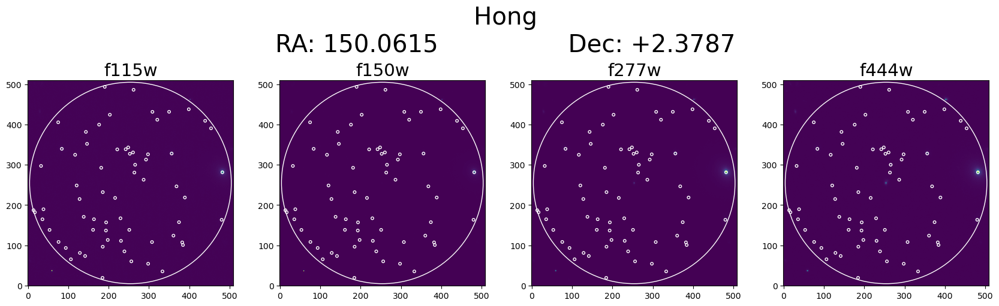

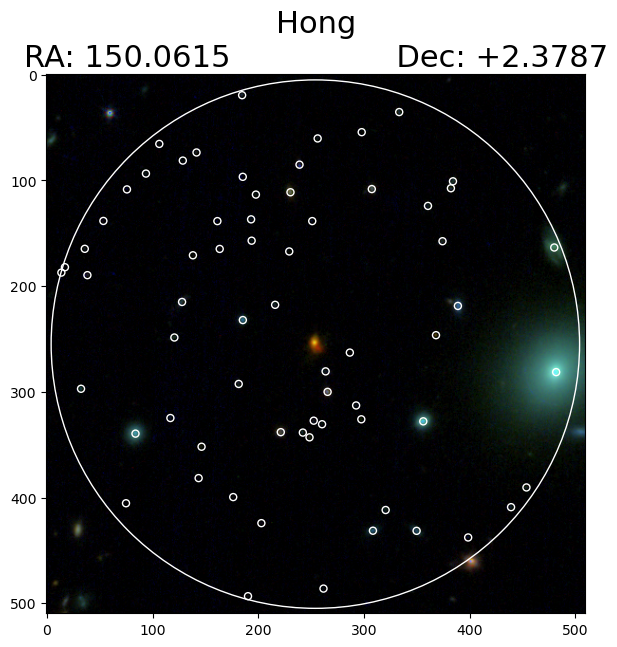

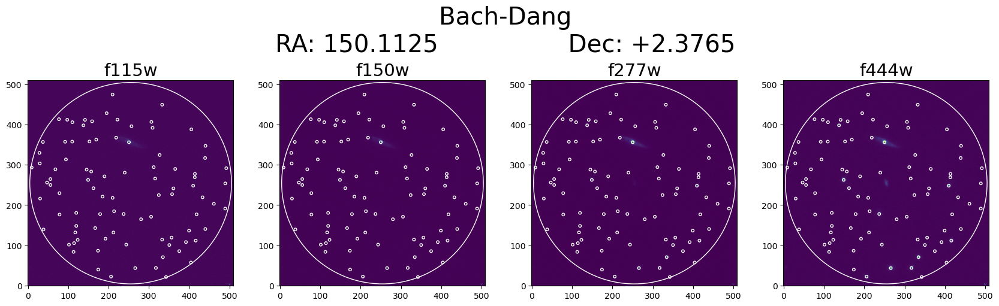

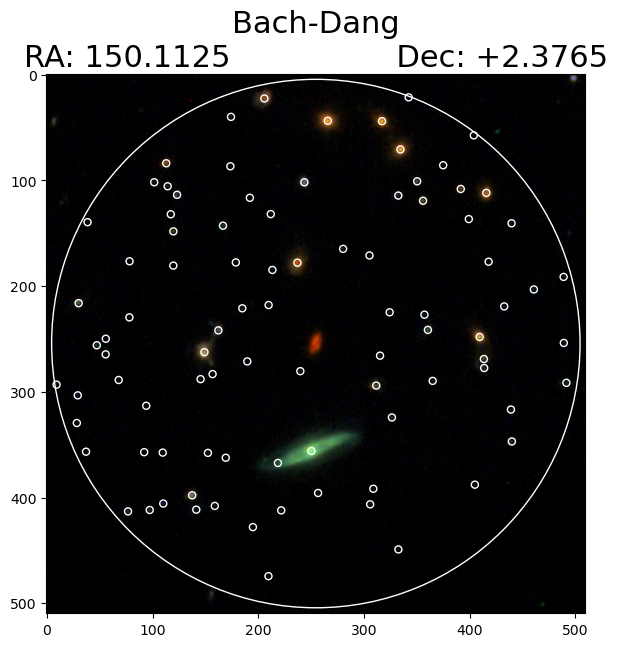

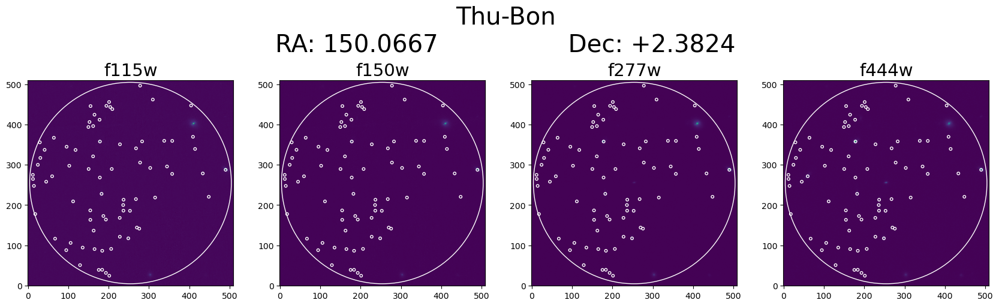

...

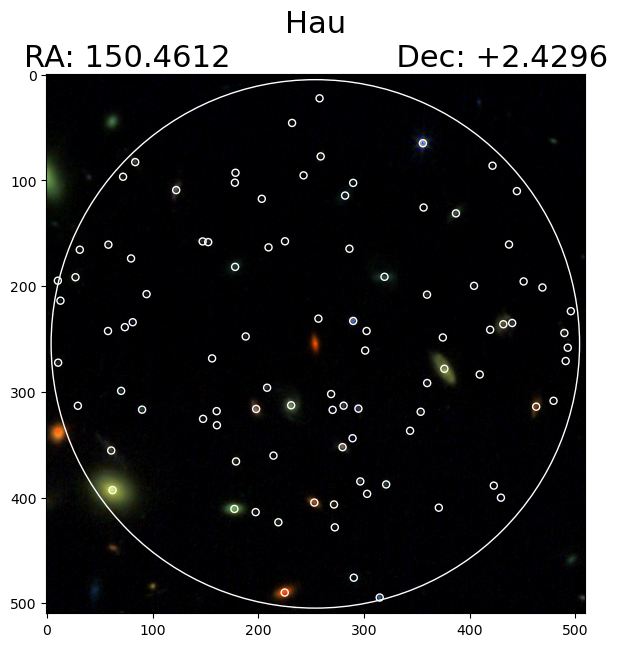

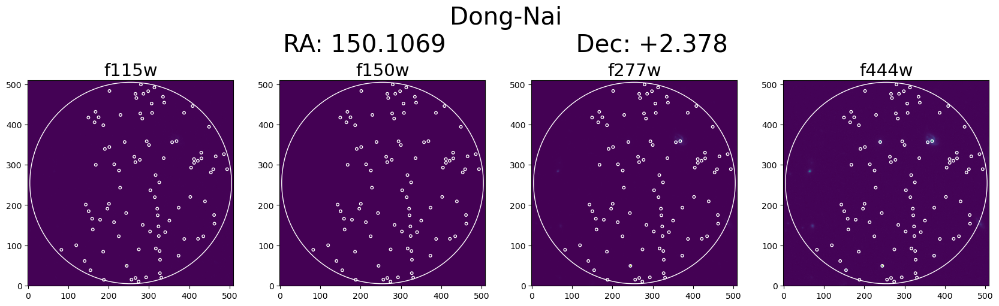

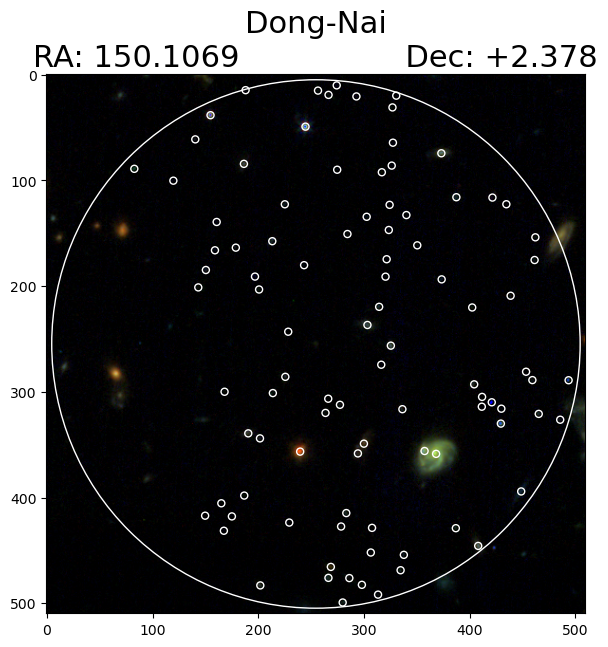

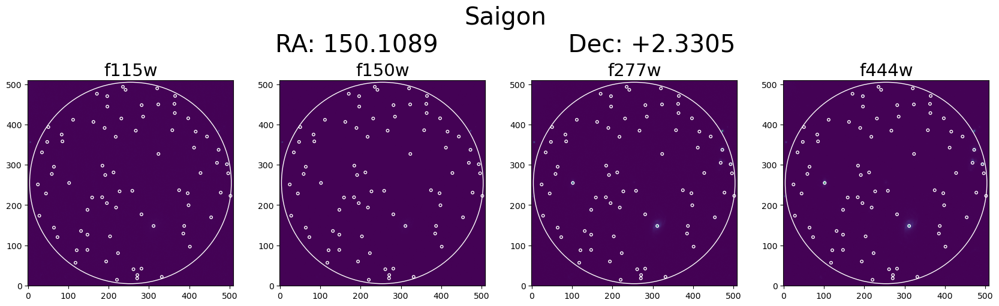

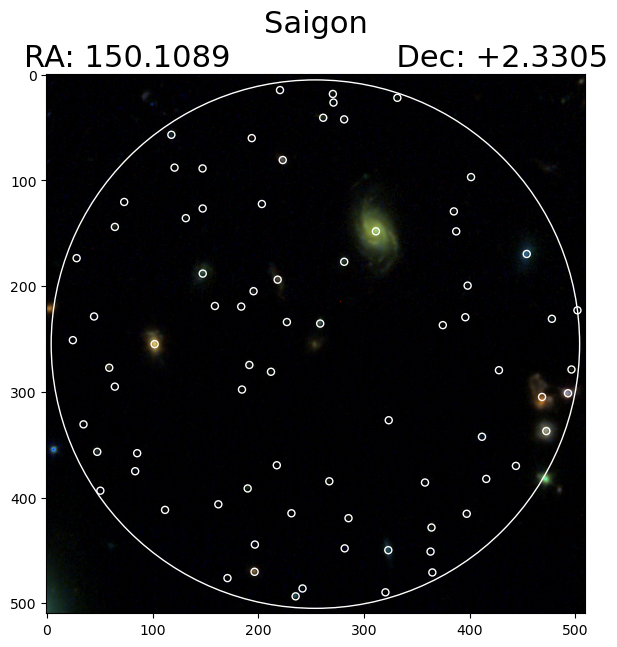

In [121]:
### this loops over each of the galaxies we're looking for
for our_galaxy in range(np.size(info)):
    ### this saves the name of our galaxy so it's easier to make plots
    galaxy_name = info[our_galaxy][0]

    ### this selects a search radius for our galaxy based on the angular size
    search_radius = angular_sizes[our_galaxy]

    ### this picks out the tile where our galaxy can be found in the image
    tile_search = our_tiles[our_galaxy]

    ### this creates a matplotlib figure in advance for the loop after
    fig, axes = plt.subplots(1,how_many_bands, constrained_layout=True, figsize=(4.2*how_many_bands, 5))

    ### this creates an empty list to append RGB band datas into
    ### the RGB bands are: F444W (red), F277W (green) and F150W (blue)
    ### note that due to the order in nircam_bands, the order here will be flipped as BGR
    BGR_bands = []

    ### now, we make the aperture for each of the neighbors
    # this reads in the RAs and Decs of all the neighbors around each galaxy
    neigh_ra = np.array(neigh[neigh['our_id']==our_galaxy]['RA_DETEC'])
    neigh_dec = np.array(neigh[neigh['our_id']==our_galaxy]['DEC_DETEC'])
    number_of_nbrs = np.size(neigh_ra)

    ### this loops over all the available bands for NIRCam
    for i in range(how_many_bands):
        # this selects one of the bands to work with
        band = nircam_bands[i]
    
        # this creates a path to lead the code to our fits file
        our_file = '/Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_' + band + '_COSMOS-Web_60mas_' + tile_search + '_sci.fits'
    
        # this opens the fits file that matches the path above
        file = fits.open(our_file)
        file.info()
        
        # this saves the WCS setting from the fits file to be used later
        our_wcs = WCS(file[0].header)
    
        # this gets the data of the catalog
        our_data = file[0].data
    
        # this closes the file to save up memory
        file.close()
        
        # this sets a centering position based on the RA and Dec of our galaxy
        position = SkyCoord(ra=galaxy_ra[our_galaxy]*u.degree, dec=galaxy_dec[our_galaxy]*u.degree)
        
        # this creates a cutout. the additional factor of 2.04 is to make sure that the region is shown.
        cutout = Cutout2D(our_data, position, size=search_radius*2.04, wcs=our_wcs)

        # this saves the arrays if they're RGB bands (the latter three bands in our array)
        if i > 0:
            BGR_bands.append(cutout.data)
        
        # this plots our images
        ax = axes[i]
        ax.imshow(cutout.data, origin='lower', interpolation='nearest')  

        ### now, we make a region that encompasses everything, including our galaxy and its neighbors
        # this creates the region
        sky_region = CircleSkyRegion(position, search_radius)
        pixel_region = sky_region.to_pixel(wcs=cutout.wcs)

        # this plots the region
        pixel_region.plot(ax=ax, color='white', lw=1.0)

        ### now, we make the aperture for each of the neighbors
        # this creates an empty list to save all the sky regions we'll plot for each neighbor
        all_nbr = []

        # this reads in the coords of every neighbor and plots them on the plot we already have.
        for idx in range(number_of_nbrs):
            nbr_pos = SkyCoord(ra=neigh_ra[idx]*u.degree, dec=neigh_dec[idx]*u.degree)
            aperture_size = Angle(0.2, 'arcsec')
            nbr_sky_region = CircleSkyRegion(nbr_pos, aperture_size)
            nbr_pixel_region = nbr_sky_region.to_pixel(wcs=cutout.wcs)
            all_nbr.append(nbr_pixel_region)
            nbr_pixel_region.plot(ax=ax, color='white', lw=1.0)
        
        all_nbr = np.array(all_nbr, dtype='object')

        # this sets the title to specify which band
        ax.set_title(band, size=21)

    fig.suptitle(galaxy_name + '\nRA: ' + str(np.round(galaxy_ra[our_galaxy], 4)) + ' \
                Dec: +' + str(np.round(galaxy_dec[our_galaxy], 4)), size=29)
    fig.savefig('visualizations/' + galaxy_name + '.png')

    # this creates an RGB image
    fig2, ax2 = plt.subplots(figsize=(7,7))
    RGB_image = make_lupton_rgb(BGR_bands[2], BGR_bands[1], BGR_bands[0], stretch=0.5)
    ax2.imshow(RGB_image)

    # this creates the region that encompasses everything
    sky_region = CircleSkyRegion(position, search_radius)
    pixel_region = sky_region.to_pixel(wcs=cutout.wcs)
    pixel_region.plot(ax=ax2, color='white', lw=1.0)

    # this plots the region of all the neighbors
    for nbr_pixel_region in all_nbr:
        nbr_pixel_region.plot(ax=ax2, color='white', lw=1.0)

    ax2.set_title(galaxy_name + '\nRA: ' + str(np.round(galaxy_ra[our_galaxy], 4)) + ' \
                Dec: +' + str(np.round(galaxy_dec[our_galaxy], 4)), size=22)
    fig2.savefig('visualizations/' + galaxy_name + '_rgb.png')

Now, read in the CIGALE results and figure out which neighbor is a *REAL* potential neighbor (i.e. their redshifts are within plus/minus 1 of the quenched galaxy's spectroscopic redshift).

In [19]:
# this reads in the results FITS file that CIGALE made
cigale_results = fits.open('out/results.fits')
cigale_results.info()

# this saves the WCS setting to be used later, just in case
cigale_wcs = WCS(cigale_results[1].header)

Filename: out/results.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    350   994R x 115C   [K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D]   


In [20]:
# this gets the data from the results FITS file
cigale_data = Table(cigale_results[1].data).to_pandas()

In [103]:
cigale_z = cigale_data['bayes.universe.redshift']
cigale_z_err = cigale_data['bayes.universe.redshift_err']

In [230]:
# let's apply our first criterion. we'll only be taking galaxy model fits with chi2 < 7.
# the reason why we choose 7 is because all the plots generated for the ones with chi2 > 7 look bad.
# the following reduced dataframe is once we've done our first narrowing-down
narrowed1 = cigale_data[cigale_data['best.reduced_chi_square'] < 7]

In [237]:
# next up, let's apply our second criterion. for our criterion, we'll only take galaxy model fits
# that are based on at 3 flux detections. this is to ensure that our fits are good, 
# because you essentially can do anything to fit a curve through 1 or 2 flux detections.
print(cigale_data.iloc[1])

#print(cigale_data.columns)

id                             756257.000000
bayes.attenuation.E_BVs             0.075962
bayes.attenuation.E_BVs_err         0.066300
bayes.sfh.age_main               1405.660320
bayes.sfh.age_main_err           1602.839309
                                   ...      
best.subaru.hsc.z                   0.000093
best.vista.vircam.Y                 0.000105
best.vista.vircam.J                 0.000101
best.vista.vircam.H                 0.000111
best.vista.vircam.Ks                0.000126
Name: 1, Length: 115, dtype: float64


Now, let's repeat the analysis again, but with the *REAL* potential neighbors we've selected.

Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B4_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-03T01:59:11.190' from MJD-AVG.
Set DATE-END to '2024-01-06T17:28:50.910' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.012152 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696582650.366 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-03T02:33:49.399' from MJD-AVG.
Set DATE-END to '2024-01-06T18:03:33.852' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.962298 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686149605.641 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-02T11:26:42.626' from MJD-AVG.
Set DATE-END to '2024-01-06T17:28:50.910' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-02T12:01:20.603' from MJD-AVG.
Set DATE-END to '2024-01-06T18:03:33.852' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.998031 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696584712.167 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T13:30:10.219' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.888100 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695630093.460 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T14:04:49.430' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.887810 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695623362.790 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T17:28:21.465' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T18:03:01.413' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.004838 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696585931.786 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B5_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2024-01-01T13:30:10.219' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.888100 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695630093.460 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T14:04:49.430' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.887810 from OBSGEO-[XYZ].
Set OBSGEO-H to 1695623362.790 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T17:28:21.465' from MJD-AVG.
Set DATE-END to '2024-01-06T20:06:50.261' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.002883 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696586013.959 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-01-01T18:03:01.413' from MJD-AVG.
Set DATE-END to '2024-01-06T20:41:43.955' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     9.004838 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696585931.786 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B7_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-09-07T08:08:39.516' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-09-02T04:30:47.638' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.225' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.880441 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689561270.072 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-27T10:47:09.482' from MJD-AVG.
Set DATE-END to '2024-01-06T13:45:27.595' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.877923 from OBSGEO-[XYZ].
Set OBSGEO-H to 1689690570.898 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-08-24T20:33:34.974' from MJD-AVG.
Set DATE-END to '2024-01-06T14:20:21.289' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f115w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f150w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f277w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   
Filename: /Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_f444w_COSMOS-Web_60mas_B8_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SCI           1 PrimaryHDU      73   (9600, 12455)   float32   


Set DATE-AVG to '2023-12-15T06:24:31.291' from MJD-AVG.
Set DATE-END to '2024-01-06T18:30:50.458' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.938284 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696349812.184 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-12-17T00:49:53.682' from MJD-AVG.
Set DATE-END to '2024-01-06T19:05:22.649' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.941421 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696374654.240 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-12-04T06:52:06.528' from MJD-AVG.
Set DATE-END to '2024-01-06T18:30:50.458' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.940522 from OBSGEO-[XYZ].
Set OBSGEO-H to 1696367709.229 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2023-12-06T20:13:01.371' from MJD-AVG.
Set DATE-END to '2024-01-06T19:05:22.649' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to     8.955753 from OBSGEO-[XYZ].
Set OBSGEO-H to 1686788846.143 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


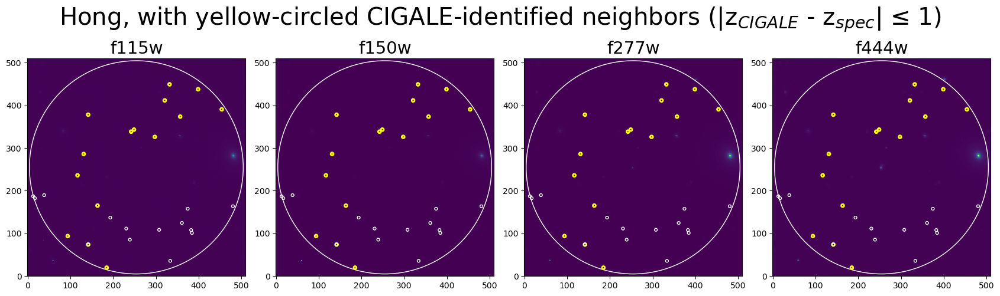

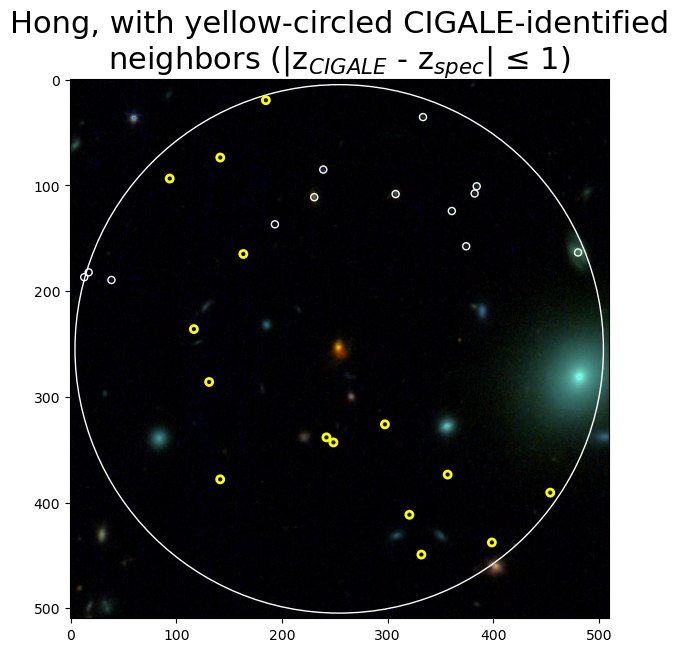

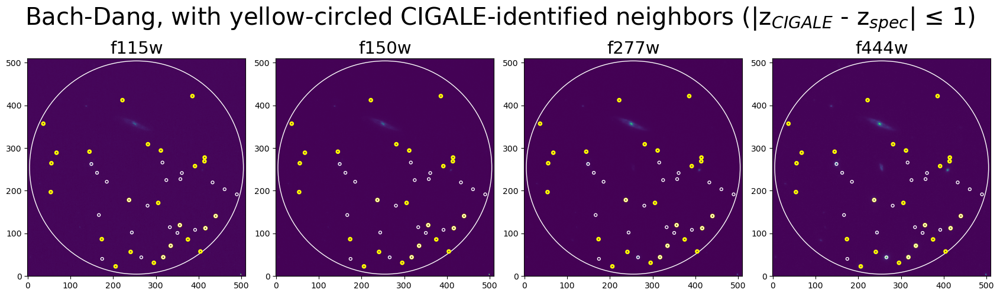

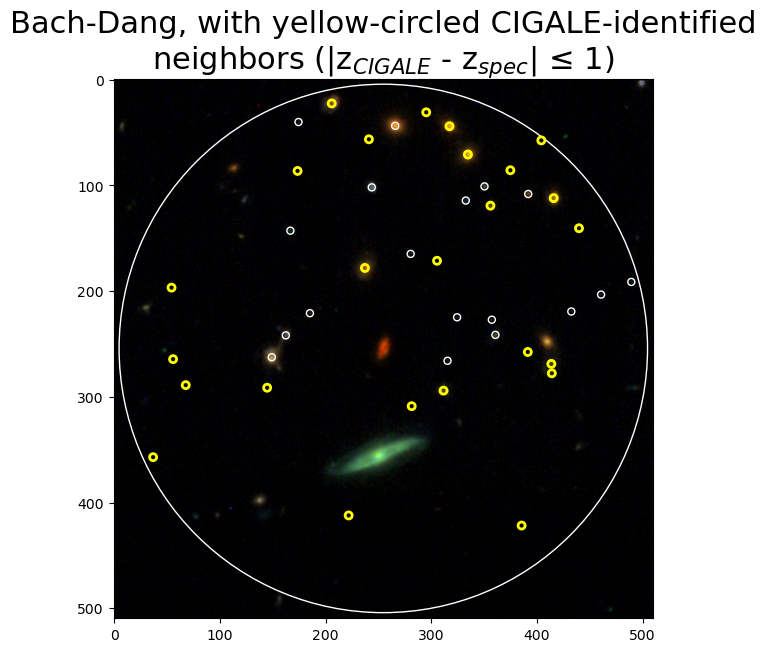

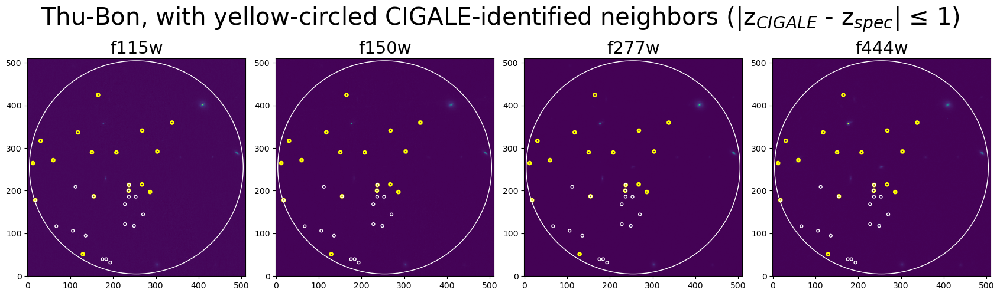

...

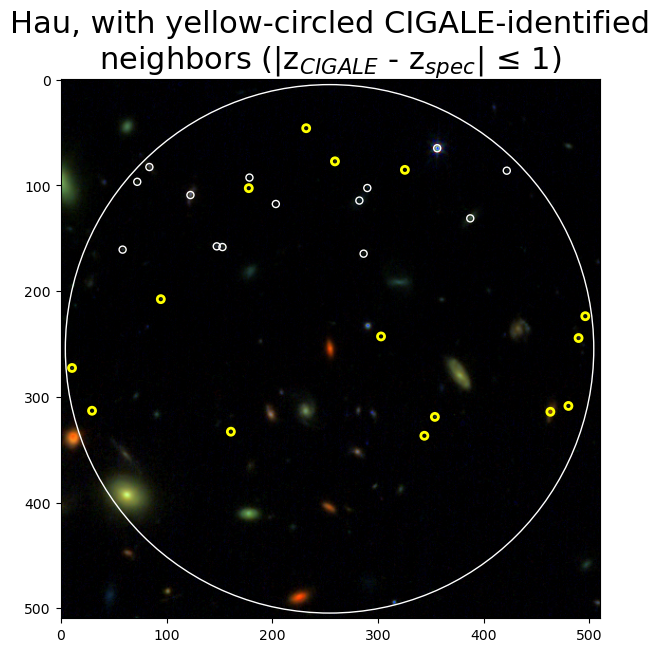

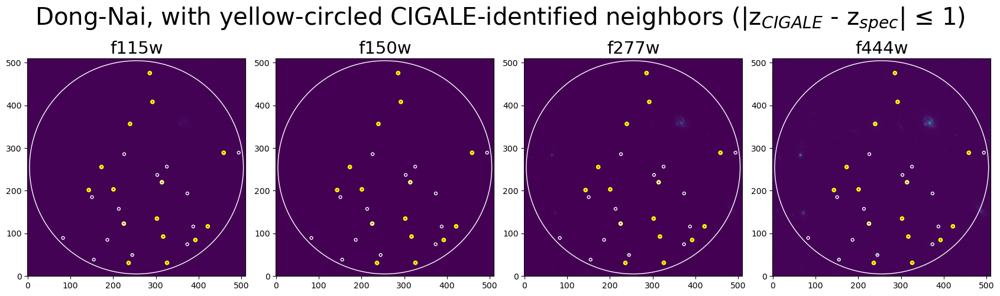

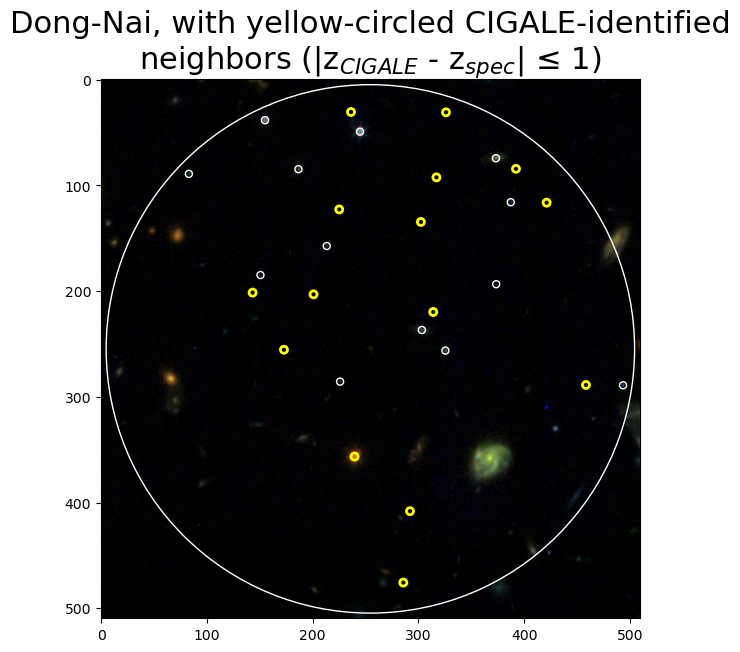

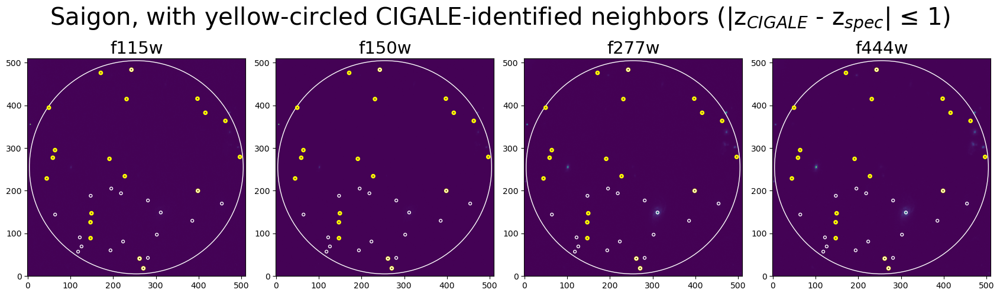

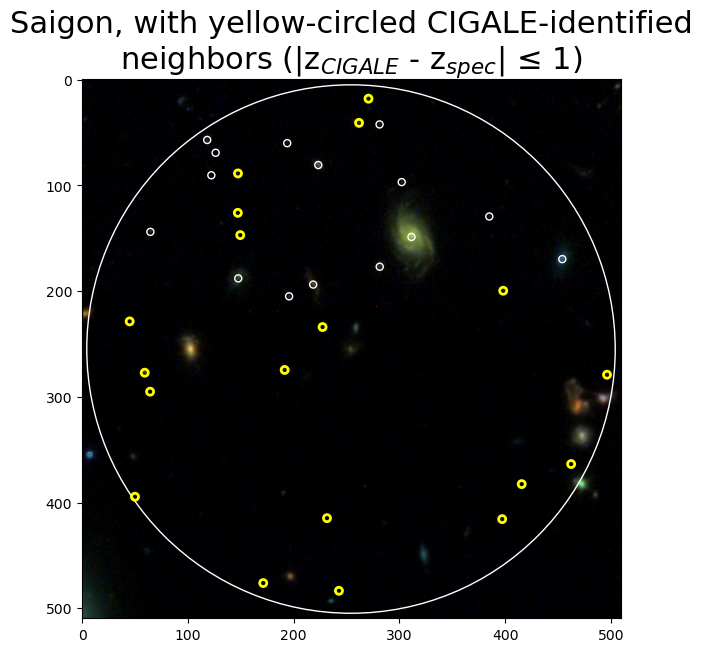

In [118]:
all_real_neigh_id = []

### this loops over each of the galaxies we're looking for
for our_galaxy in range(np.size(info)):
    ### this saves the name of our galaxy so it's easier to make plots
    galaxy_name = info[our_galaxy][0]

    ### this selects a search radius for our galaxy based on the angular size
    search_radius = angular_sizes[our_galaxy]

    ### this picks out the tile where our galaxy can be found in the image
    tile_search = our_tiles[our_galaxy]

    ### this creates a matplotlib figure in advance for the loop after
    fig, axes = plt.subplots(1,how_many_bands, constrained_layout=True, figsize=(4.2*how_many_bands, 5))

    ### this creates an empty list to append RGB band datas into
    ### the RGB bands are: F444W (red), F277W (green) and F150W (blue)
    ### note that due to the order in nircam_bands, the order here will be flipped as BGR
    BGR_bands = []

    ### now, we make the aperture for each of the neighbors
    # this reads in the RAs, Decs and estimated z's of all the neighbors around each galaxy
    neigh_ra = np.array(neigh[neigh['our_id']==our_galaxy]['ra'])
    neigh_dec = np.array(neigh[neigh['our_id']==our_galaxy]['dec'])
    neigh_id = np.array(neigh[neigh['our_id']==our_galaxy]['id'])

    nbrs = np.where(neigh['our_id']==our_galaxy)
    neigh_z = np.array(cigale_z.iloc[nbrs])
    neigh_z_err = np.array(cigale_z_err.iloc[nbrs])

    # this narrows down the list further, only taking the galaxies 
    # whose redshift is within plus/minus 0.5 of the QG
    criteria1 = (np.abs(neigh_z + neigh_z_err - galaxy_redshift[our_galaxy]) <= 0.5) | (np.abs(neigh_z - neigh_z_err - galaxy_redshift[our_galaxy]) <= 0.5)
    real_neigh_ra = neigh_ra[criteria1]
    real_neigh_dec = neigh_dec[criteria1]
    real_neigh_id = neigh_id[criteria1]

    # this saves the indices of the narrowed-down neighbors
    all_real_neigh_id.append(real_neigh_id)
    
    number_of_real_nbrs = np.size(real_neigh_ra)
    
    ### this loops over all the available bands for NIRCam
    for i in range(how_many_bands):
        # this selects one of the bands to work with
        band = nircam_bands[i]
    
        # this creates a path to lead the code to our fits file
        our_file = '/Volumes/LaCie/COSMOS_DATA/cweb_tiles/mosaic_nircam_' + band + '_COSMOS-Web_60mas_' + tile_search + '_sci.fits'
    
        # this opens the fits file that matches the path above
        file = fits.open(our_file)
        file.info()
        
        # this saves the WCS setting from the fits file to be used later
        our_wcs = WCS(file[0].header)
    
        # this gets the data of the catalog
        our_data = file[0].data
    
        # this closes the file to save up memory
        file.close()
        
        # this sets a centering position based on the RA and Dec of our galaxy
        position = SkyCoord(ra=galaxy_ra[our_galaxy]*u.degree, dec=galaxy_dec[our_galaxy]*u.degree)
        
        # this creates a cutout. the additional factor of 2.04 is to make sure that the region is shown.
        cutout = Cutout2D(our_data, position, size=search_radius*2.04, wcs=our_wcs)

        # this saves the arrays if they're RGB bands (the latter three bands in our array)
        if i > 0:
            BGR_bands.append(cutout.data)
        
        # this plots our images
        ax = axes[i]
        ax.imshow(cutout.data, origin='lower', interpolation='nearest')  

        ### now, we make a region that encompasses everything, including our galaxy and its neighbors
        # this creates the region
        sky_region = CircleSkyRegion(position, search_radius)
        pixel_region = sky_region.to_pixel(wcs=cutout.wcs)

        # this plots the region
        pixel_region.plot(ax=ax, color='white', lw=1.0)

        ### now, we make the aperture for each of the neighbors
        # this creates an empty list to save all the sky regions we'll plot for each neighbor
        all_nbr = []
        all_real_nbr = []

        # this reads in the coords of every neighbor and plots them on the plot we already have.
        for idx in range(number_of_real_nbrs):
            # this turns the locations of the neighbors and REAL neighbors into SkyCoord
            nbr_pos = SkyCoord(ra=neigh_ra[idx]*u.degree, dec=neigh_dec[idx]*u.degree)
            real_nbr_pos = SkyCoord(ra=real_neigh_ra[idx]*u.degree, dec=real_neigh_dec[idx]*u.degree)

            # this creates the regions to plot
            aperture_size = Angle(0.2, 'arcsec')
            nbr_sky_region = CircleSkyRegion(nbr_pos, aperture_size)
            nbr_pixel_region = nbr_sky_region.to_pixel(wcs=cutout.wcs)
            all_nbr.append(nbr_pixel_region)

            real_nbr_sky_region = CircleSkyRegion(real_nbr_pos, aperture_size)
            real_nbr_pixel_region = real_nbr_sky_region.to_pixel(wcs=cutout.wcs)
            all_real_nbr.append(real_nbr_pixel_region)

            # this is the plotting part
            nbr_pixel_region.plot(ax=ax, color='white', lw=1.0)
            real_nbr_pixel_region.plot(ax=ax, color='yellow', lw=2.0)
        
        all_nbr = np.array(all_nbr, dtype='object')

        # this sets the title to specify which band
        ax.set_title(band, size=21)

    fig.suptitle(galaxy_name + ', with yellow-circled CIGALE-identified neighbors (|z$_{CIGALE}$ - z$_{spec}$| ≤ 1)', size=29)
    fig.savefig('visualizations/' + galaxy_name + '_real_nbrs.png')

    # this creates an RGB image
    fig2, ax2 = plt.subplots(figsize=(7,7))
    RGB_image = make_lupton_rgb(BGR_bands[2], BGR_bands[1], BGR_bands[0], stretch=0.5)
    ax2.imshow(RGB_image)

    # this creates the region that encompasses everything
    sky_region = CircleSkyRegion(position, search_radius)
    pixel_region = sky_region.to_pixel(wcs=cutout.wcs)
    pixel_region.plot(ax=ax2, color='white', lw=1.0)

    # this plots the region of all the neighbors
    for nbr_pixel_region in all_nbr:
        nbr_pixel_region.plot(ax=ax2, color='white', lw=1.0)
    for real_nbr_pixel_region in all_real_nbr:
        real_nbr_pixel_region.plot(ax=ax2, color='yellow', lw=2.0)

    ax2.set_title(galaxy_name + ', with yellow-circled CIGALE-identified\nneighbors (|z$_{CIGALE}$ - z$_{spec}$| ≤ 1)', size=22)
    fig2.savefig('visualizations/' + galaxy_name + '_rgb_real_nbrs.png')

In [120]:
i = 0
for central_galaxy in all_real_neigh_id:
    print(central_galaxy, i)
    i += 1

[756228 756324 756791 756809 756895 756931 780328 780483 780660 780757
 780870 780995 781006 781150 781162] 0
[757782 757859 757860 757931 757934 757952 758035 758176 758177 758222
 782291 782339 782341 782409 782410 782619 782848 782934 782977 783240
 783257 804680 830151 830355 830622] 1
[757035 757048 757093 757094 757195 757208 757210 757212 757258 757292
 757334 757435 780960 781298 781337 781436 781608] 2
[759045 759140 759203 759290 759298 759460 759474 759485 759529 759545
 759713 783935 783941 784019 784044 784094 784096 784159 784265 784266
 784281 784413 784451 784478 784569 784580 784614 784646 784687 784695
 784799] 3
[613998 614117 614138 614257 614287 614320 614384 614433 614469 614548
 614564 614660 614670 614677 614744 641340 641741 642033 642233 642380
 642398 642463] 4
[661660 661672 661675 661795 661884 661909 661921 661988 661989 661990
 662092 662128 662135 662158 683408 683416 683597 683770 684001] 5
[659467 659706 659786 659833 659914 659919 680426 680500 680537

In [122]:
sum = 0
for array in all_real_neigh_id:
    sum += np.size(array)

In [124]:
print(sum)

178


In [239]:
good_fits_list = []
good_fits = 0
which_galaxy = 0
for galaxy in all_real_neigh_id:
    for nbr_idx in galaxy:
        chi2 = cigale_data[cigale_data['id']==nbr_idx]['best.reduced_chi_square'].values[0]
        if chi2 < 7:
            good_fits_list.append(cigale_data[cigale_data['best.reduced_chi_square'] == chi2])
            print(cigale_data[cigale_data['id']==nbr_idx])
            good_fits += 1
    which_galaxy += 1

good_fits_list = np.array(good_fits_list, dtype='object')

       id  bayes.attenuation.E_BVs  bayes.attenuation.E_BVs_err  \
0  756228                 0.080502                     0.018474   

   bayes.sfh.age_main  bayes.sfh.age_main_err  bayes.universe.redshift  \
0          643.526922              259.886058                 3.272042   

   bayes.universe.redshift_err  bayes.sfh.sfr  bayes.sfh.sfr_err  \
0                     0.494741       2.552444           0.744915   

   bayes.sfh.sfr100Myrs  ...  best.jwst.nircam.F356W  best.jwst.nircam.F410M  \
0              2.716116  ...                0.000118                0.000142   

   best.subaru.hsc.g  best.subaru.hsc.r  best.subaru.hsc.i  best.subaru.hsc.z  \
0           0.000041           0.000062           0.000065           0.000059   

   best.vista.vircam.Y  best.vista.vircam.J  best.vista.vircam.H  \
0             0.000061             0.000071             0.000092   

   best.vista.vircam.Ks  
0              0.000114  

[1 rows x 115 columns]
       id  bayes.attenuation.E_BVs  bayes.

In [ ]:
### Now, we're doing some elimination to ensure as much as possible that our neighbors are REAL potential neighbors
# We have our first criteria:

for our_galaxy in range(np.size(info)):

criteria1 = (np.abs(neigh_z + neigh_z_err - galaxy_redshift[our_galaxy]) <= 0.5) | (np.abs(neigh_z - neigh_z_err - galaxy_redshift[our_galaxy]) <= 0.5)
    real_neigh_ra = neigh_ra[criteria1]
    real_neigh_dec = neigh_dec[criteria1]
    real_neigh_id = neigh_id[criteria1]

In [220]:
print(good_fits_list[np.where(good_fits_list['id'] == 784281)])

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [222]:
print(good_fits_list['id'])

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices